# 34212-Lab-S-Report 
This notebook will explore the use of a Deep Neural Network to classify objects in the iCubWorld robotics vision dataset.

## Obtaining datasets

Dataset consists of 200 objects divided into 20 categories. Each object has 10 aquisitions (~3600 images per object). 

Objects:

'body lotion', 'book', 'cellphone', 'flower', 'glass', 'hairbrush', 'hair clip', 'mouse', 'mug', 'oven glove', 'pencil case', 'perfume', 'remote', 'ring binder', 'soap dispenser', 'soda bottle', 'sprayer', 'squeezer', 'sunglasses', 'wallet'.

In [1]:
!wget -nc https://zenodo.org/record/835510/files/part1_cropped.tar.gz https://zenodo.org/record/835510/files/part2_cropped.tar.gz 

#https://zenodo.org/record/835510/files/part3_cropped.tar.gz https://zenodo.org/record/835510/files/part4_cropped.tar.gz

--2023-04-19 17:02:40--  https://zenodo.org/record/835510/files/part1_cropped.tar.gz
Resolving zenodo.org (zenodo.org)... 188.185.124.72
Connecting to zenodo.org (zenodo.org)|188.185.124.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1609543185 (1.5G) [application/octet-stream]
Saving to: ‘part1_cropped.tar.gz’

part1_cropped.tar.g 100%[===================>]   1.50G  4.58MB/s    in 8m 14s  

2023-04-19 17:10:56 (3.11 MB/s) - ‘part1_cropped.tar.gz’ saved [1609543185/1609543185]

--2023-04-19 17:10:56--  https://zenodo.org/record/835510/files/part2_cropped.tar.gz
Reusing existing connection to zenodo.org:443.
HTTP request sent, awaiting response... 200 OK
Length: 1549790267 (1.4G) [application/octet-stream]
Saving to: ‘part2_cropped.tar.gz’

part2_cropped.tar.g 100%[===================>]   1.44G  2.18MB/s    in 8m 15s  

2023-04-19 17:19:12 (2.98 MB/s) - ‘part2_cropped.tar.gz’ saved [1549790267/1549790267]

FINISHED --2023-04-19 17:19:12--
Total wall clock t

In [13]:
!tar -xf part1_cropped.tar.gz  --skip-old-files 
!tar -xf part2_cropped.tar.gz  --skip-old-files 
#!tar -xf /content/part3_cropped.tar.gz  --skip-old-files 
#!tar -xf /content/part4_cropped.tar.gz  --skip-old-files 

In [3]:
#!rm -r /content/data /content/struct_data /content/train_val_test

In [14]:
!mkdir data
!mv part1_cropped/* data
!mv part2_cropped/* data
#!mv part3_cropped/* data
#!mv part4_cropped/* data

Following block moves all images of objects in the MIX aquisition into new folder structure where all objects are grouped by their category.

In [15]:
import shutil
import os
import numpy as np

data_dir = "data"
struct_data_dir = "struct_data"

for root, dirs, files in os.walk(data_dir, topdown=False):
  for name in files:
    if ".ipynb" not in root and "MIX" in root and ".txt" not in name:
      obj_name = root.split("/")[1]

      src = os.path.join(root, name)

      path_to_move = f"{struct_data_dir}/{obj_name}"
      
      if not os.path.exists(path_to_move):
        os.makedirs(path_to_move)
      
      dst = f"{path_to_move}/{name}"

      shutil.move(src, dst)


data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/right
book
data/book/book8/MIX/day6/rig

Now we split our obtained data into a training and testing images. The train-val-test split can be specified in the ratio paramter below! The original folder will remain to be used to testing and the new folder created will contain all of the training images. 

In [16]:
%pip install split-folders

import splitfolders

output_dir = "train_val_test"

splitfolders.ratio(struct_data_dir, output=output_dir,seed=1337, ratio=(.8, .1, .1), group_prefix=None, move=False)

Note: you may need to restart the kernel to use updated packages.


Copying files: 53103 files [00:03, 14922.07 files/s]


## Initialisation and Preprocessing

In [1]:
from tensorflow.keras import utils
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Rescaling
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.optimizers import SGD, Adam, RMSprop


# importing of service libraries
import csv

print('Libraries imported.')

2023-04-25 16:36:04.014425: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-25 16:36:06.652566: I tensorflow/c/logging.cc:34] Successfully opened dynamic library libdirectml.d6f03b303ac3c4f2eeb8ca631688c9757b361310.so
2023-04-25 16:36:06.652664: I tensorflow/c/logging.cc:34] Successfully opened dynamic library libdxcore.so
2023-04-25 16:36:06.671897: I tensorflow/c/logging.cc:34] Successfully opened dynamic library libd3d12.so
2023-04-25 16:36:10.409423: I tensorflow/c/logging.cc:34] DirectML device enumeration: found 1 compatible adapters.


Libraries imported.


In [2]:
#training constants
BATCH_SIZE = 32
N_EPOCH = 3 
N_CLASSES = 10
VERBOSE = 1
#VALIDATION_SPLIT = 0.2
OPTIM = RMSprop()
IMG_ROWS = 256
IMG_COLS = 256
IMG_CHANNELS = 3
LABEL_MODE = 'categorical'

train_dir = "train_val_test/train"
val_dir = "train_val_test/val"
test_dir = "train_val_test/test"

print('Main variables initialised.')

Main variables initialised.


In [7]:
# Training dataset
train_ds = utils.image_dataset_from_directory(
  train_dir,
  seed=123,
  label_mode = LABEL_MODE,
  image_size=(IMG_ROWS, IMG_COLS),
  batch_size=BATCH_SIZE)

# Validation dataset
val_ds = utils.image_dataset_from_directory(
  val_dir,
  seed=123,
  label_mode = LABEL_MODE,
  image_size=(IMG_ROWS, IMG_COLS),
  batch_size=BATCH_SIZE)

# Testing dataset
test_ds = utils.image_dataset_from_directory(
  test_dir,
  seed=123,
  label_mode = LABEL_MODE,
  image_size=(IMG_ROWS, IMG_COLS),
  batch_size=BATCH_SIZE)

print(train_ds.class_names)

Found 42478 files belonging to 10 classes.


2023-04-19 18:07:10.245064: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-19 18:07:10.245816: I tensorflow/c/logging.cc:34] DirectML: creating device on adapter 0 (AMD Radeon RX 5700)
2023-04-19 18:07:10.380800: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 18:07:10.380846: W tensorflow/core/common_runtime/pluggable_device/pluggable_device_bfc_allocator.cc:28] Overriding allow_growth setting because force_memory_growth was requested by the device.
2023-04-19 18:07:10.380868: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factor

Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
['book', 'cellphone', 'hairbrush', 'hairclip', 'mouse', 'pencilcase', 'perfume', 'ringbinder', 'sunglasses', 'wallet']


## Visualisation of training data

tf.Tensor([0. 0. 0. 0. 0. 1. 0. 0. 0. 0.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 0. 1. 0. 0. 0. 0.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 0. 0. 0. 0. 1. 0.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 0. 0. 0. 0. 0. 1.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 0. 1. 0. 0. 0. 0.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 0. 0. 1. 0. 0. 0.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 1. 0. 0. 0. 0. 0.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 0. 0. 1. 0. 0. 0.], shape=(10,), dtype=float32)
tf.Tensor([0. 0. 0. 0. 0. 0. 1. 0. 0. 0.], shape=(10,), dtype=float32)


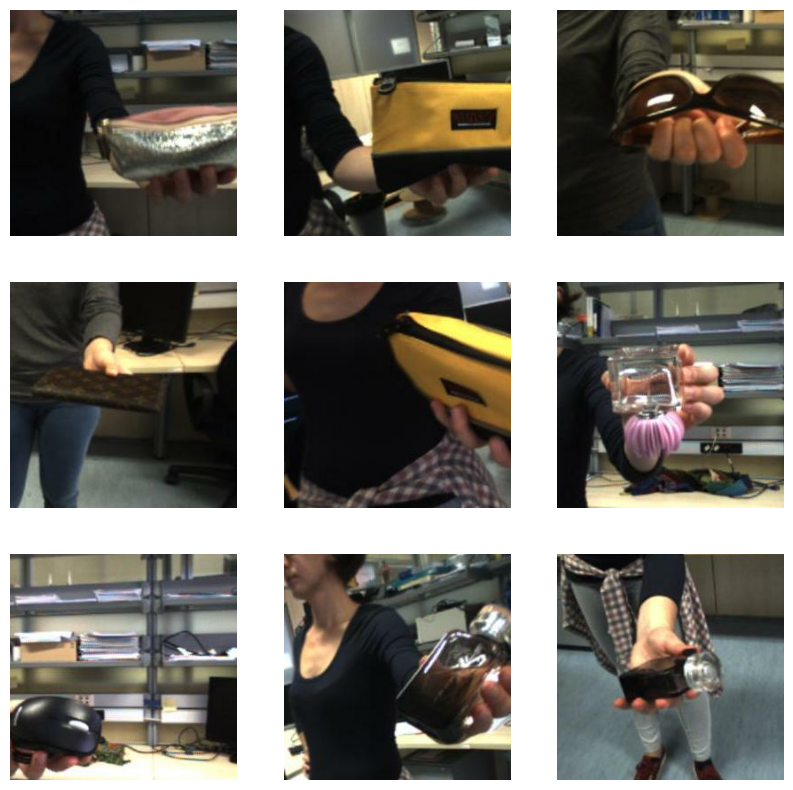

In [19]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    print(labels[i])
    #plt.title(str(labels[i]))
    plt.axis("off")

In [36]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 256, 256, 3)
(32, 10)


## Configuration of datasets for perfomance!

In [42]:
#train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
#val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Experimental Hyperparameter Definition!


In [25]:
KERNEL_SIZE = 3
HIDDEN_DROPOUT_RATE = 0.25
NUM_EPOCS = 3 

## CNN Definition

In [26]:
# Complex DNN model definition
model = Sequential()

# Normalisation layer 
model.add(Rescaling(1./255)),
 
model.add(Conv2D(32, kernel_size=KERNEL_SIZE, padding='same', input_shape=(IMG_ROWS, IMG_COLS, IMG_CHANNELS)))
model.add(Activation('relu'))
model.add(Conv2D(32, kernel_size=KERNEL_SIZE, padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(HIDDEN_DROPOUT_RATE))
 
model.add(Conv2D(64, kernel_size=KERNEL_SIZE, padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(64, 3, 3))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(HIDDEN_DROPOUT_RATE))
 
model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(N_CLASSES))
model.add(Activation('softmax'))

In [27]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.build(input_shape=(None, IMG_ROWS, IMG_COLS, IMG_CHANNELS))
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 256, 256, 32)      896       
                                                                 
 activation_12 (Activation)  (None, 256, 256, 32)      0         
                                                                 
 conv2d_9 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 activation_13 (Activation)  (None, 256, 256, 32)      0         
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 128, 128, 32)     0         
 2D)                                                             
                                                      

# Visualise the Model

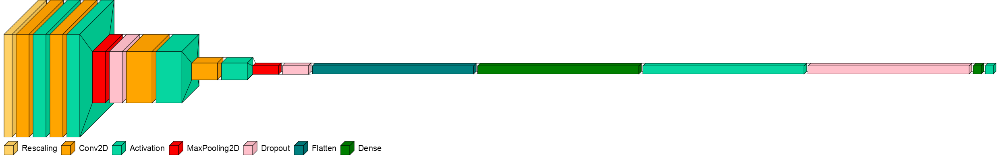

In [29]:
#%pip install visualkeras

import visualkeras 
from PIL import ImageFont

from collections import defaultdict

color_map = defaultdict(dict)
color_map[Conv2D]['fill'] = 'orange'
color_map[Dropout]['fill'] = 'pink'
color_map[MaxPooling2D]['fill'] = 'red'
color_map[Dense]['fill'] = 'green'
color_map[Flatten]['fill'] = 'teal'

font = ImageFont.truetype("arial.ttf", 20)  # using comic sans is strictly prohibited!
visualkeras.layered_view(model, legend=True, scale_xy=1, scale_z=1, max_xy=1000, color_map=color_map, font=font)  # font is optional!

## Training Model!

In [11]:
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=NUM_EPOCS,
  verbose = VERBOSE
)

Epoch 1/3


2023-04-19 18:08:13.807737: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 18:08:13.897339: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 18:08:13.897398: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


 482/1328 [=========>....................] - ETA: 3:29 - loss: 1.9605 - accuracy: 0.2977

KeyboardInterrupt: 

## Evaluating Model!

42/42 [==============================] - 16s 360ms/step - loss: 0.4440 - accuracy: 0.8470

Test score/loss: 0.444001704454422
Test accuracy: 0.8469637036323547
dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


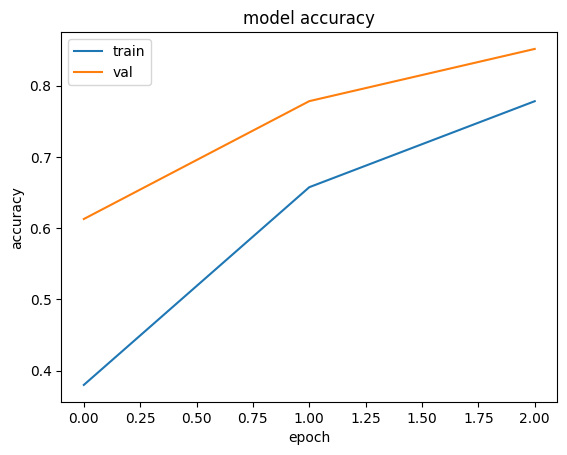

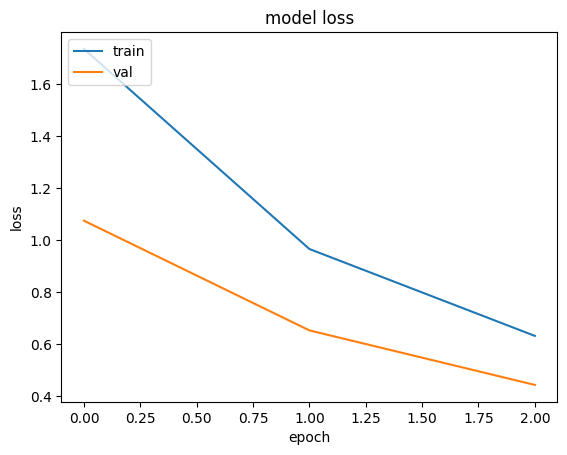

In [32]:
import matplotlib.pyplot as plt

score = model.evaluate(test_ds, verbose=VERBOSE)
print("\nTest score/loss:", score[0])
print('Test accuracy:', score[1])

# list all data in history
print(history.history.keys())

# summarize history for accuracy
#plt.plot(mo)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# MAIN EXPERIMENT!
Hyperparamters: Kernel Size, Dropout Rate, Batch Size

In [12]:
# DATA FILE SETUP 

FILEPATH = 'experimental_data.csv'
header = ['exp_num', 'kernel_size', 'dropout_rate', 'batch_size', 'test_acc', 'test_loss', 'train_acc', 'val_acc', 'train_loss', 'val_loss']


with open(FILEPATH, 'w', encoding='UTF8', newline='') as f:
    writer = csv.writer(f)
    # write the header
    writer.writerow(header)

FileNotFoundError: [Errno 2] No such file or directory: '/content/experimental_data.csv'

In [15]:
# TRAINING CONSTANTS 
N_EPOCH = 3 
N_CLASSES = 10
VERBOSE = 1
#VALIDATION_SPLIT = 0.2
OPTIM = RMSprop()
IMG_ROWS = 256
IMG_COLS = 256
IMG_CHANNELS = 3
LABEL_MODE = 'categorical'

train_dir = "train_val_test/train"
val_dir = "train_val_test/val"
test_dir = "train_val_test/test"

# EXPERIMENTAL HYPER PARAMS
KERNEL_SIZES = [3, 5, 7]
HIDDEN_DROPOUT_RATES = [0.25, 0.35, 0.45]
BATCH_SIZES = [64, 128]

print('Main variables initialised.')

i = 9

for BATCH_SIZE in BATCH_SIZES:
  for HIDDEN_DROPOUT_RATE in HIDDEN_DROPOUT_RATES:
    for KERNEL_SIZE in KERNEL_SIZES:

      # SETUP DATASETS
      # Training dataset
      train_ds = utils.image_dataset_from_directory(
        train_dir,
        seed=123,
        label_mode = LABEL_MODE,
        image_size=(IMG_ROWS, IMG_COLS),
        batch_size=BATCH_SIZE)

      # Validation dataset
      val_ds = utils.image_dataset_from_directory(
        val_dir,
        seed=123,
        label_mode = LABEL_MODE,
        image_size=(IMG_ROWS, IMG_COLS),
        batch_size=BATCH_SIZE)

      # Testing dataset
      test_ds = utils.image_dataset_from_directory(
        test_dir,
        seed=123,
        label_mode = LABEL_MODE,
        image_size=(IMG_ROWS, IMG_COLS),
        batch_size=BATCH_SIZE)

      # Complex DNN model definition
      model = Sequential()

      # Normalisation layer 
      model.add(Rescaling(1./255)),
      
      model.add(Conv2D(32, kernel_size=KERNEL_SIZE, padding='same', input_shape=(IMG_ROWS, IMG_COLS, IMG_CHANNELS)))
      model.add(Activation('relu'))
      model.add(Conv2D(32, kernel_size=KERNEL_SIZE, padding='same'))
      model.add(Activation('relu'))
      model.add(MaxPooling2D(pool_size=(2, 2)))
      model.add(Dropout(HIDDEN_DROPOUT_RATE))
      
      model.add(Conv2D(64, kernel_size=KERNEL_SIZE, padding='same'))
      model.add(Activation('relu'))
      model.add(Conv2D(64, 3, 3))
      model.add(Activation('relu'))
      model.add(MaxPooling2D(pool_size=(2, 2)))
      model.add(Dropout(HIDDEN_DROPOUT_RATE))
      
      model.add(Flatten())
      model.add(Dense(512))
      model.add(Activation('relu'))
      model.add(Dropout(0.5))
      model.add(Dense(N_CLASSES))
      model.add(Activation('softmax'))

      model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

      model.build(input_shape=(None, IMG_ROWS, IMG_COLS, IMG_CHANNELS))

      # TRAIN MODEL
      history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=NUM_EPOCS,
        verbose = VERBOSE
      )

      # EVALUATE MODEL 
      score = model.evaluate(test_ds, verbose=VERBOSE)
      test_loss = score[0]
      test_acc = score[1]
      train_acc = history.history['accuracy'][2]
      val_acc = history.history['val_accuracy'][2]
      train_loss = history.history['loss'][2]
      val_loss = history.history['val_loss'][2]


      ## EXPORT DATA
      i += 1
      data = [i, KERNEL_SIZE, HIDDEN_DROPOUT_RATE, BATCH_SIZE, test_acc, test_loss, train_acc, val_acc, train_loss, val_loss]

      FILEPATH = 'experimental_data.csv'

      with open(FILEPATH, 'a', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)
        # write the data
        writer.writerow(data)




Main variables initialised.
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 18:20:21.422573: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 18:20:21.515079: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 18:20:21.515149: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - ETA: 0s - loss: 1.4183 - accuracy: 0.4915

2023-04-19 18:22:38.112704: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 18:22:38.145066: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 18:22:38.145135: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - 144s 216ms/step - loss: 1.4183 - accuracy: 0.4915 - val_loss: 0.7096 - val_accuracy: 0.7625
Epoch 2/3
664/664 [==============================] - 143s 215ms/step - loss: 0.6992 - accuracy: 0.7546 - val_loss: 0.4198 - val_accuracy: 0.8664
Epoch 3/3
84/84 [==============================] - 6s 74ms/step - loss: 0.3082 - accuracy: 0.9015
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 18:27:53.429274: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 18:27:53.517910: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 18:27:53.517976: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - ETA: 0s - loss: 1.2888 - accuracy: 0.5461

2023-04-19 18:31:26.167611: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 18:31:26.200662: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 18:31:26.200725: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - 231s 348ms/step - loss: 1.2888 - accuracy: 0.5461 - val_loss: 0.5928 - val_accuracy: 0.7972
Epoch 2/3
664/664 [==============================] - 267s 402ms/step - loss: 0.5488 - accuracy: 0.8083 - val_loss: 0.3415 - val_accuracy: 0.8803
Epoch 3/3
84/84 [==============================] - 9s 104ms/step - loss: 0.2681 - accuracy: 0.9137
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 18:40:04.513135: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 18:40:04.597105: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 18:40:04.597158: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - ETA: 0s - loss: 1.6652 - accuracy: 0.4032

2023-04-19 18:46:16.787044: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 18:46:16.820490: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 18:46:16.820544: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - 386s 580ms/step - loss: 1.6652 - accuracy: 0.4032 - val_loss: 1.1321 - val_accuracy: 0.6101
Epoch 2/3
664/664 [==============================] - 343s 516ms/step - loss: 0.9756 - accuracy: 0.6549 - val_loss: 0.6579 - val_accuracy: 0.7812
Epoch 3/3
84/84 [==============================] - 13s 159ms/step - loss: 0.5043 - accuracy: 0.8366
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 18:58:13.567472: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 18:58:13.652953: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 18:58:13.653005: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - ETA: 0s - loss: 1.4725 - accuracy: 0.4782

2023-04-19 19:00:30.299369: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 19:00:30.331427: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 19:00:30.331491: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - 144s 216ms/step - loss: 1.4725 - accuracy: 0.4782 - val_loss: 0.7663 - val_accuracy: 0.7294
Epoch 2/3
664/664 [==============================] - 201s 303ms/step - loss: 0.7172 - accuracy: 0.7502 - val_loss: 0.4351 - val_accuracy: 0.8570
Epoch 3/3
84/84 [==============================] - 6s 73ms/step - loss: 0.3350 - accuracy: 0.8972
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 19:06:34.191658: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 19:06:34.274993: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 19:06:34.275042: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - ETA: 0s - loss: 1.4019 - accuracy: 0.5010

2023-04-19 19:10:03.432780: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 19:10:03.464812: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 19:10:03.464864: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - 218s 328ms/step - loss: 1.4019 - accuracy: 0.5010 - val_loss: 0.7561 - val_accuracy: 0.7424
Epoch 2/3
664/664 [==============================] - 218s 329ms/step - loss: 0.6822 - accuracy: 0.7594 - val_loss: 0.4848 - val_accuracy: 0.8424
Epoch 3/3
84/84 [==============================] - 9s 104ms/step - loss: 0.2970 - accuracy: 0.9037
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 19:17:42.617896: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 19:17:42.703867: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 19:17:42.703918: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - ETA: 0s - loss: 1.6755 - accuracy: 0.4050

2023-04-19 19:23:10.348856: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 19:23:10.382140: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 19:23:10.382241: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - 343s 516ms/step - loss: 1.6755 - accuracy: 0.4050 - val_loss: 1.0010 - val_accuracy: 0.6487
Epoch 2/3
664/664 [==============================] - 363s 547ms/step - loss: 0.9195 - accuracy: 0.6744 - val_loss: 0.6132 - val_accuracy: 0.7936
Epoch 3/3
84/84 [==============================] - 13s 159ms/step - loss: 0.4482 - accuracy: 0.8569
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 19:35:59.822997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 19:35:59.915555: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 19:35:59.915613: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - ETA: 0s - loss: 1.3494 - accuracy: 0.5239

2023-04-19 19:38:27.444742: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 19:38:27.479627: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 19:38:27.479683: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - 158s 238ms/step - loss: 1.3494 - accuracy: 0.5239 - val_loss: 0.6112 - val_accuracy: 0.7980
Epoch 2/3
664/664 [==============================] - 267s 403ms/step - loss: 0.6480 - accuracy: 0.7746 - val_loss: 0.3833 - val_accuracy: 0.8777
Epoch 3/3
84/84 [==============================] - 6s 72ms/step - loss: 0.2699 - accuracy: 0.9103
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 19:47:09.974922: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 19:47:10.065552: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 19:47:10.065623: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - ETA: 0s - loss: 1.3727 - accuracy: 0.5134

2023-04-19 19:50:46.091435: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 19:50:46.124085: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 19:50:46.124140: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - 287s 431ms/step - loss: 1.3727 - accuracy: 0.5134 - val_loss: 0.7915 - val_accuracy: 0.7288
Epoch 2/3
664/664 [==============================] - 228s 343ms/step - loss: 0.6929 - accuracy: 0.7557 - val_loss: 0.4241 - val_accuracy: 0.8592
Epoch 3/3
84/84 [==============================] - 9s 104ms/step - loss: 0.3500 - accuracy: 0.8829
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 20:00:00.258007: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 20:00:00.348640: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 20:00:00.348692: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - ETA: 0s - loss: 1.6723 - accuracy: 0.3947

2023-04-19 20:05:27.598427: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 20:05:27.631619: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 20:05:27.631704: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


664/664 [==============================] - 341s 513ms/step - loss: 1.6723 - accuracy: 0.3947 - val_loss: 0.9873 - val_accuracy: 0.6491
Epoch 2/3
664/664 [==============================] - 341s 513ms/step - loss: 0.8916 - accuracy: 0.6845 - val_loss: 0.6513 - val_accuracy: 0.7784
Epoch 3/3
84/84 [==============================] - 13s 159ms/step - loss: 0.3599 - accuracy: 0.8874
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 20:17:21.467976: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 20:17:21.552550: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 20:17:21.552602: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - ETA: 0s - loss: 1.2869 - accuracy: 0.5458

2023-04-19 20:19:36.556796: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 20:19:36.589141: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 20:19:36.589193: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - 153s 458ms/step - loss: 1.2869 - accuracy: 0.5458 - val_loss: 0.6411 - val_accuracy: 0.7823
Epoch 2/3
332/332 [==============================] - 199s 599ms/step - loss: 0.5483 - accuracy: 0.8114 - val_loss: 0.3698 - val_accuracy: 0.8750
Epoch 3/3
42/42 [==============================] - 6s 141ms/step - loss: 0.2525 - accuracy: 0.9186
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 20:25:48.154339: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 20:25:48.239493: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 20:25:48.239545: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - ETA: 0s - loss: 1.4833 - accuracy: 0.4770

2023-04-19 20:29:16.420733: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 20:29:16.452831: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 20:29:16.452884: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - 217s 653ms/step - loss: 1.4833 - accuracy: 0.4770 - val_loss: 0.8213 - val_accuracy: 0.7137
Epoch 2/3
332/332 [==============================] - 217s 652ms/step - loss: 0.6678 - accuracy: 0.7672 - val_loss: 0.3973 - val_accuracy: 0.8700
Epoch 3/3
42/42 [==============================] - 9s 205ms/step - loss: 0.2958 - accuracy: 0.9047
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 20:36:52.876105: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 20:36:52.960720: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 20:36:52.960775: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - ETA: 0s - loss: 1.6465 - accuracy: 0.4167

2023-04-19 20:42:18.904764: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 20:42:18.937032: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 20:42:18.937095: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - 340s 1s/step - loss: 1.6465 - accuracy: 0.4167 - val_loss: 0.9636 - val_accuracy: 0.6740
Epoch 2/3
332/332 [==============================] - 339s 1s/step - loss: 0.8197 - accuracy: 0.7115 - val_loss: 0.5138 - val_accuracy: 0.8304
Epoch 3/3
42/42 [==============================] - 13s 314ms/step - loss: 0.3112 - accuracy: 0.9007
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 20:54:09.669446: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 20:54:09.752884: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 20:54:09.752950: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - ETA: 0s - loss: 1.3589 - accuracy: 0.5210

2023-04-19 20:56:24.584524: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 20:56:24.617348: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 20:56:24.617402: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - 141s 424ms/step - loss: 1.3589 - accuracy: 0.5210 - val_loss: 0.6506 - val_accuracy: 0.7867
Epoch 2/3
332/332 [==============================] - 141s 423ms/step - loss: 0.5800 - accuracy: 0.7991 - val_loss: 0.3632 - val_accuracy: 0.8845
Epoch 3/3
42/42 [==============================] - 6s 141ms/step - loss: 0.2368 - accuracy: 0.9201
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 21:01:23.236458: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 21:01:23.319725: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 21:01:23.319782: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - ETA: 0s - loss: 1.5059 - accuracy: 0.4681

2023-04-19 21:04:50.860423: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 21:04:50.892460: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 21:04:50.892514: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - 217s 651ms/step - loss: 1.5059 - accuracy: 0.4681 - val_loss: 0.8621 - val_accuracy: 0.7105
Epoch 2/3
332/332 [==============================] - 217s 652ms/step - loss: 0.7653 - accuracy: 0.7352 - val_loss: 0.4654 - val_accuracy: 0.8400
Epoch 3/3
42/42 [==============================] - 9s 205ms/step - loss: 0.3670 - accuracy: 0.8802
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 21:12:26.780949: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 21:12:26.864900: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 21:12:26.864949: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - ETA: 0s - loss: 1.8694 - accuracy: 0.3212

2023-04-19 21:17:52.296299: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 21:17:52.328649: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 21:17:52.328711: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - 339s 1s/step - loss: 1.8694 - accuracy: 0.3212 - val_loss: 1.2840 - val_accuracy: 0.5411
Epoch 2/3
332/332 [==============================] - 339s 1s/step - loss: 1.0897 - accuracy: 0.6013 - val_loss: 0.7547 - val_accuracy: 0.7363
Epoch 3/3
42/42 [==============================] - 13s 313ms/step - loss: 0.5926 - accuracy: 0.7898
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 21:29:54.722575: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 21:29:54.822635: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 21:29:54.822685: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - ETA: 0s - loss: 1.7900 - accuracy: 0.3562

2023-04-19 21:32:09.080098: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 21:32:09.112690: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 21:32:09.112755: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - 141s 422ms/step - loss: 1.7900 - accuracy: 0.3562 - val_loss: 1.1739 - val_accuracy: 0.6080
Epoch 2/3
332/332 [==============================] - 141s 425ms/step - loss: 1.0369 - accuracy: 0.6304 - val_loss: 0.6509 - val_accuracy: 0.7737
Epoch 3/3
42/42 [==============================] - 6s 142ms/step - loss: 0.4904 - accuracy: 0.8383
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 21:37:08.932805: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 21:37:09.029643: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 21:37:09.029694: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - ETA: 0s - loss: 1.6090 - accuracy: 0.4272

2023-04-19 21:40:36.649697: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 21:40:36.684067: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 21:40:36.684119: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - 217s 651ms/step - loss: 1.6090 - accuracy: 0.4272 - val_loss: 0.9385 - val_accuracy: 0.6849
Epoch 2/3
332/332 [==============================] - 216s 650ms/step - loss: 0.8490 - accuracy: 0.7017 - val_loss: 0.5524 - val_accuracy: 0.8183
Epoch 3/3
42/42 [==============================] - 9s 205ms/step - loss: 0.3582 - accuracy: 0.8866
Found 42478 files belonging to 10 classes.
Found 5306 files belonging to 10 classes.
Found 5319 files belonging to 10 classes.
Epoch 1/3


2023-04-19 21:48:11.614658: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 21:48:11.700592: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 21:48:11.700662: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - ETA: 0s - loss: 1.7257 - accuracy: 0.3777

2023-04-19 21:53:37.745313: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-19 21:53:37.777994: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-19 21:53:37.778047: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 13993 MB memory) -> physical PluggableDevice (device: 0, name: DML, pci bus id: <undefined>)


332/332 [==============================] - 340s 1s/step - loss: 1.7257 - accuracy: 0.3777 - val_loss: 1.1394 - val_accuracy: 0.6018
Epoch 2/3
332/332 [==============================] - 339s 1s/step - loss: 0.8709 - accuracy: 0.6924 - val_loss: 0.6096 - val_accuracy: 0.7965
Epoch 3/3
42/42 [==============================] - 13s 314ms/step - loss: 0.3796 - accuracy: 0.8746


In [28]:

header = ['exp_num', 'kernel_size', 'dropout_rate', 'batch_size', 'train_acc', 'val_acc', 'train_loss', 'val_loss']
data = [i, k_size, d_rate, b_size, train_acc, val_acc, train_loss, val_loss]


with open('/content/experimental_data.csv', 'w', encoding='UTF8', newline='') as f:
    writer = csv.writer(f)

    # write the header
    writer.writerow(header)

    # write the data
    writer.writerow(data)




NameError: ignored